<a href="https://colab.research.google.com/github/prikmm/MLprojects/blob/main/notebooks/GANS_and__autoencoders.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
# Python ≥3.5 is required
import sys
assert sys.version_info >= (3, 5)

# Scikit-Learn ≥0.20 is required
import sklearn
assert sklearn.__version__ >= "0.20"

try:
    # %tensorflow_version only exists in Colab.
    %tensorflow_version 2.x
    IS_COLAB = True
except Exception:
    IS_COLAB = False

# TensorFlow ≥2.0 is required
import tensorflow as tf
from tensorflow import keras
assert tf.__version__ >= "2.0"

if not tf.config.list_physical_devices('GPU'):
    print("No GPU was detected. LSTMs and CNNs can be very slow without a GPU.")
    if IS_COLAB:
        print("Go to Runtime > Change runtime and select a GPU hardware accelerator.")

# Common imports
import numpy as np
import os

# to make this notebook's output stable across runs
np.random.seed(42)
tf.random.set_seed(42)

# To plot pretty figures
%matplotlib inline
import matplotlib as mpl
import matplotlib.pyplot as plt
mpl.rc('axes', labelsize=14)
mpl.rc('xtick', labelsize=12)
mpl.rc('ytick', labelsize=12)

# PCA with a Linear AutoEncoder:

In [2]:
np.random.seed(4)

def generate_3d_data(m, w1=0.1, w2=0.3, noise=0.1):
    angles = np.random.rand(m) * 3 * np.pi / 2 - 0.5
    data = np.empty((m, 3))
    data[:, 0] = np.cos(angles) + np.sin(angles)/2 + noise * np.random.randn(m) / 2
    data[:, 1] = np.sin(angles) * 0.7 + noise * np.random.randn(m) / 2
    data[:, 2] = data[:, 0] * w1 + data[:, 1] * w2 + noise * np.random.randn(m)
    return data

X_train = generate_3d_data(60)
X_train = X_train - X_train.mean(axis=0, keepdims=0)

In [3]:
encoder = keras.models.Sequential([keras.layers.Dense(2, input_shape=[3])])
decoder = keras.models.Sequential([keras.layers.Dense(3, input_shape=[2])])
autoencoder = keras.models.Sequential([encoder, decoder])

autoencoder.compile(loss="mse", optimizer=keras.optimizers.SGD(lr=0.1))

In [4]:
history = autoencoder.fit(X_train, X_train, epochs=20)
codings = encoder.predict(X_train)

Epoch 1/20
2/2 [==============================] - 3s 6ms/step - loss: 0.3041
Epoch 2/20
2/2 [==============================] - 0s 5ms/step - loss: 0.2736
Epoch 3/20
2/2 [==============================] - 0s 8ms/step - loss: 0.2685
Epoch 4/20
2/2 [==============================] - 0s 10ms/step - loss: 0.2681
Epoch 5/20
2/2 [==============================] - 0s 3ms/step - loss: 0.2384
Epoch 6/20
2/2 [==============================] - 0s 4ms/step - loss: 0.2237
Epoch 7/20
2/2 [==============================] - 0s 5ms/step - loss: 0.2113
Epoch 8/20
2/2 [==============================] - 0s 4ms/step - loss: 0.2046
Epoch 9/20
2/2 [==============================] - 0s 4ms/step - loss: 0.1869
Epoch 10/20
2/2 [==============================] - 0s 6ms/step - loss: 0.1750
Epoch 11/20
2/2 [==============================] - 0s 5ms/step - loss: 0.1595
Epoch 12/20
2/2 [==============================] - 0s 4ms/step - loss: 0.1535
Epoch 13/20
2/2 [==============================] - 0s 4ms/step - loss: 0

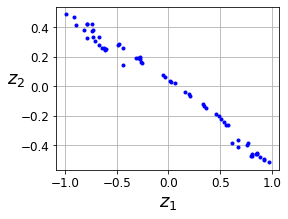

In [5]:
fig = plt.figure(figsize=(4,3))
plt.plot(codings[:,0], codings[:, 1], "b.")
plt.xlabel("$z_1$", fontsize=18)
plt.ylabel("$z_2$", fontsize=18, rotation=0)
plt.grid(True)
plt.show()

# Stacked Autoencoders

In [6]:
(X_train_full, y_train_full), (X_test, y_test) = keras.datasets.fashion_mnist.load_data()
X_train_full = X_train_full.astype(np.float32) / 255
X_test = X_test.astype(np.float32) / 255
X_train, X_valid = X_train_full[:-5000], X_train_full[-5000:]
y_train, y_valid = y_train_full[:-5000], y_train_full[-5000:]

4423680/4422102 [==============================] - 0s 0us/step


In [7]:
def rounded_accuracy(y_true, y_pred):
    return keras.metrics.binary_accuracy(tf.round(y_true), tf.round(y_pred))

In [8]:
stacked_encoder = keras.models.Sequential([
    keras.layers.Flatten(input_shape=[28, 28]),
    keras.layers.Dense(100, activation="selu"),
    keras.layers.Dense(30, activation="selu"),
])

stacked_decoder = keras.models.Sequential([
    keras.layers.Dense(100, activation="selu", input_shape=[30]),
    keras.layers.Dense(28*28, activation="sigmoid"),
    keras.layers.Reshape([28, 28])
])

stacked_ae = keras.models.Sequential([stacked_encoder, stacked_decoder])
stacked_ae.compile(loss="binary_crossentropy",
                   optimizer=keras.optimizers.SGD(lr=1.5),
                   metrics=[rounded_accuracy])
stacked_ae.summary()
history = stacked_ae.fit(X_train, X_train, epochs=10,
                         validation_data=(X_valid, X_valid))

Model: "sequential_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
sequential_3 (Sequential)    (None, 30)                81530     
_________________________________________________________________
sequential_4 (Sequential)    (None, 28, 28)            82284     
Total params: 163,814
Trainable params: 163,814
Non-trainable params: 0
_________________________________________________________________
Epoch 1/10
1719/1719 [==============================] - 5s 3ms/step - loss: 0.3805 - rounded_accuracy: 0.8489 - val_loss: 0.3178 - val_rounded_accuracy: 0.8986
Epoch 2/10
1719/1719 [==============================] - 5s 3ms/step - loss: 0.3078 - rounded_accuracy: 0.9133 - val_loss: 0.3012 - val_rounded_accuracy: 0.9202
Epoch 3/10
1719/1719 [==============================] - 5s 3ms/step - loss: 0.2991 - rounded_accuracy: 0.9210 - val_loss: 0.2980 - val_rounded_accuracy: 0.9253
Epoch 4/10
1719/1719 [========

In [8]:
def plot_image(image):
    plt.imshow(image, cmap="binary")
    plt.axis("off")

def show_reconstruction(model, images=X_valid, n_images=5):
    reconstructions = model.predict(images[:n_images])
    fig = plt.figure(figsize=(n_images * 1.5, 3))
    for image_index in range(n_images):
        plt.subplot(2, n_images, 1 + image_index)
        plot_image(images[image_index])
        plt.subplot(2, n_images, 1 + n_images + image_index)
        plot_image(reconstructions[image_index])

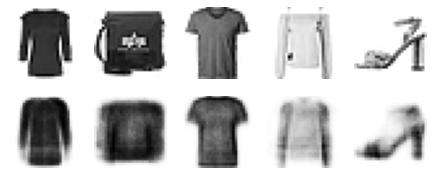

In [10]:
show_reconstruction(stacked_ae)

In [10]:
from sklearn.manifold import TSNE

X_valid_compressed = stacked_encoder.predict(X_valid)
tsne = TSNE()
X_valid_2D = tsne.fit_transform(X_valid_compressed)

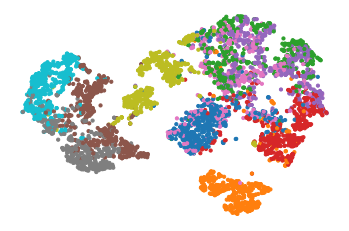

In [11]:
plt.scatter(X_valid_2D[:, 0], X_valid_2D[:, 1], c=y_valid, s=10, cmap="tab10")
plt.axis("off")
plt.show()

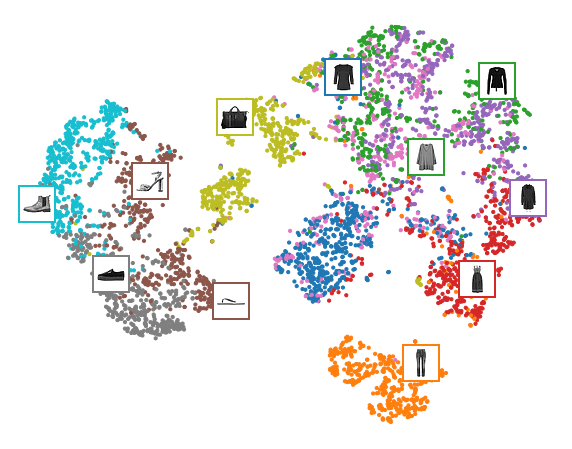

In [12]:
# adapted from https://scikit-learn.org/stable/auto_examples/manifold/plot_lle_digits.html
plt.figure(figsize=(10, 8))
cmap = plt.cm.tab10
plt.scatter(X_valid_2D[:, 0], X_valid_2D[:, 1], c=y_valid, s=10, cmap=cmap)
image_positions = np.array([[1., 1.]])
for index, position in enumerate(X_valid_2D):
    dist = np.sum((position - image_positions) ** 2, axis=1)
    if np.min(dist) > 1000: # if far enough from other images
        image_positions = np.r_[image_positions, [position]]
        imagebox = mpl.offsetbox.AnnotationBbox(
            mpl.offsetbox.OffsetImage(X_valid[index], cmap="binary"),
            position, bboxprops={"edgecolor": cmap(y_valid[index]), "lw": 2})
        plt.gca().add_artist(imagebox)
plt.axis("off")
plt.show()

# Tying Weights:

In [9]:
class DenseTranspose(keras.layers.Layer):
    def __init__(self, dense, activation=None, **kwargs):
        self.dense = dense
        self.activation = keras.activations.get(activation)
        super().__init__(**kwargs)

    def build(self, batch_input_shape):
        self.biases = self.add_weight(name="bias", initializer="zeros",
                                      shape=[self.dense.input_shape[-1]])
        super().build(batch_input_shape)
    
    def call(self, inputs):
        z = tf.matmul(inputs, self.dense.weights[0], transpose_b=True)
        return self.activation(z + self.biases)

In [17]:
dense_1 = keras.layers.Dense(100, activation="selu")
dense_2 = keras.layers.Dense(30, activation="selu")

tied_encoder = keras.models.Sequential([
    keras.layers.Flatten(input_shape=[28, 28]),
    dense_1,
    dense_2,
])

tied_decoder = keras.models.Sequential([
    DenseTranspose(dense_2, activation="selu"),
    DenseTranspose(dense_1, activation="sigmoid"),
    keras.layers.Reshape([28, 28])
])

tied_ae = keras.models.Sequential([tied_encoder, tied_decoder])

In [18]:
tied_ae.compile(loss="binary_crossentropy",
                optimizer=keras.optimizers.SGD(lr=1.5),
                metrics=[rounded_accuracy])
tied_ae.summary()
history = tied_ae.fit(X_train, X_train, epochs=10,
                      validation_data=(X_valid, X_valid))

Model: "sequential_20"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
sequential_18 (Sequential)   (None, 30)                81530     
_________________________________________________________________
sequential_19 (Sequential)   (None, 28, 28)            82414     
Total params: 82,414
Trainable params: 82,414
Non-trainable params: 0
_________________________________________________________________
Epoch 1/10
1719/1719 [==============================] - 5s 3ms/step - loss: 0.3703 - rounded_accuracy: 0.8580 - val_loss: 0.3093 - val_rounded_accuracy: 0.9048
Epoch 2/10
1719/1719 [==============================] - 4s 3ms/step - loss: 0.3002 - rounded_accuracy: 0.9197 - val_loss: 0.2950 - val_rounded_accuracy: 0.9273
Epoch 3/10
1719/1719 [==============================] - 5s 3ms/step - loss: 0.2927 - rounded_accuracy: 0.9266 - val_loss: 0.2962 - val_rounded_accuracy: 0.9171
Epoch 4/10
1719/1719 [=========

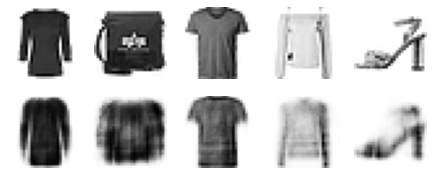

In [19]:
show_reconstruction(tied_ae)
plt.show()

# Training one AutoEncoder at a time: 

In [10]:
def train_autoencoder(n_neurons, X_train, X_valid, loss, optimizer, n_epochs=10,
                      output_activation=None, metrics=None):
    n_inputs = X_train.shape[-1]
    encoder = keras.models.Sequential([
        keras.layers.Dense(n_neurons, activation="selu", input_shape=[n_inputs]),
    ])
    decoder = keras.models.Sequential([
        keras.layers.Dense(n_inputs, activation=output_activation),
    ])
    autoencoder = keras.models.Sequential([encoder, decoder])
    autoencoder.compile(optimizer, loss, metrics=metrics)
    autoencoder.fit(X_train, X_train, epochs=n_epochs,
                    validation_data=(X_valid, X_valid))
    return encoder, decoder, encoder(X_train), encoder(X_valid)

In [16]:
tf.random.set_seed(42)
np.random.seed(42)

K = keras.backend
X_train_flat = K.batch_flatten(X_train)
X_valid_flat = K.batch_flatten(X_valid)
enc1, dec1, X_train_enc1, X_valid_enc1 = train_autoencoder(
    100, X_train_flat, X_valid_flat, "binary_crossentropy",
    keras.optimizers.SGD(lr=1.5), output_activation="sigmoid",
    metrics=[rounded_accuracy])
enc2, dec2, _, _ = train_autoencoder(
    30, X_train_enc1, X_valid_enc1, "mse", keras.optimizers.SGD(lr=0.05),
    output_activation="selu",
)

Epoch 1/10
1719/1719 [==============================] - 5s 3ms/step - loss: 0.3952 - rounded_accuracy: 0.8460 - val_loss: 0.3123 - val_rounded_accuracy: 0.9146
Epoch 2/10
1719/1719 [==============================] - 4s 2ms/step - loss: 0.3070 - rounded_accuracy: 0.9176 - val_loss: 0.3006 - val_rounded_accuracy: 0.9246
Epoch 3/10
1719/1719 [==============================] - 4s 2ms/step - loss: 0.2967 - rounded_accuracy: 0.9267 - val_loss: 0.2934 - val_rounded_accuracy: 0.9317
Epoch 4/10
1719/1719 [==============================] - 4s 2ms/step - loss: 0.2906 - rounded_accuracy: 0.9328 - val_loss: 0.2888 - val_rounded_accuracy: 0.9363
Epoch 5/10
1719/1719 [==============================] - 4s 2ms/step - loss: 0.2860 - rounded_accuracy: 0.9372 - val_loss: 0.2857 - val_rounded_accuracy: 0.9392
Epoch 6/10
1719/1719 [==============================] - 4s 2ms/step - loss: 0.2844 - rounded_accuracy: 0.9396 - val_loss: 0.2834 - val_rounded_accuracy: 0.9409
Epoch 7/10
1719/1719 [==================

In [20]:
stacked_ae_1_by_1 = keras.models.Sequential([
    keras.layers.Flatten(input_shape=[28, 28]),
    enc1, enc2, dec2, dec1,
    keras.layers.Reshape([28, 28])
])

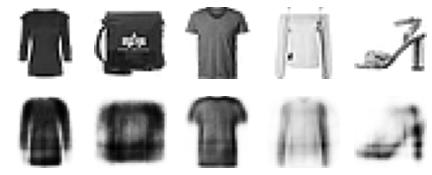

In [21]:
show_reconstruction(stacked_ae_1_by_1)
plt.show()

In [21]:
stacked_ae_1_by_1.compile(loss="binary_crossentropy",
                          optimizer=keras.optimizers.SGD(lr=0.1),
                          metrics=[rounded_accuracy])
history = stacked_ae_1_by_1.fit(X_train, X_train, epochs=50,
                                validation_data=(X_valid, X_valid))

Epoch 1/50
1719/1719 [==============================] - 5s 3ms/step - loss: 0.2866 - rounded_accuracy: 0.9339 - val_loss: 0.2883 - val_rounded_accuracy: 0.9341
Epoch 2/50
1719/1719 [==============================] - 5s 3ms/step - loss: 0.2866 - rounded_accuracy: 0.9345 - val_loss: 0.2881 - val_rounded_accuracy: 0.9347
Epoch 3/50
1719/1719 [==============================] - 5s 3ms/step - loss: 0.2861 - rounded_accuracy: 0.9348 - val_loss: 0.2879 - val_rounded_accuracy: 0.9347
Epoch 4/50
1719/1719 [==============================] - 5s 3ms/step - loss: 0.2863 - rounded_accuracy: 0.9349 - val_loss: 0.2877 - val_rounded_accuracy: 0.9350
Epoch 5/50
1719/1719 [==============================] - 5s 3ms/step - loss: 0.2857 - rounded_accuracy: 0.9354 - val_loss: 0.2876 - val_rounded_accuracy: 0.9351
Epoch 6/50
1719/1719 [==============================] - 5s 3ms/step - loss: 0.2868 - rounded_accuracy: 0.9352 - val_loss: 0.2874 - val_rounded_accuracy: 0.9350
Epoch 7/50
1719/1719 [==================

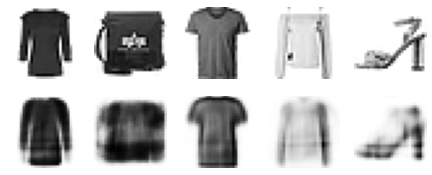

In [22]:
show_reconstruction(stacked_ae_1_by_1)
plt.show()

# Convolutional AutoEncoders:

In [11]:
conv_encoder = keras.models.Sequential([
    keras.layers.Reshape([28, 28, 1], input_shape=[28, 28]),
    keras.layers.Conv2D(16, kernel_size=3, padding="same", activation="selu"),
    keras.layers.MaxPool2D(pool_size=2),
    keras.layers.Conv2D(32, kernel_size=3, padding="same", activation="selu"),
    keras.layers.MaxPool2D(pool_size=2),
    keras.layers.Conv2D(64, kernel_size=3, padding="same", activation="selu"),
    keras.layers.MaxPool2D(pool_size=2),
])
conv_decoder = keras.models.Sequential([
    keras.layers.Conv2DTranspose(32, kernel_size=3, strides=2, padding="valid",
                                 activation="selu",
                                 input_shape=[3, 3, 64]),
    keras.layers.Conv2DTranspose(16, kernel_size=3, strides=2, padding="same",
                                 activation="selu"),
    keras.layers.Conv2DTranspose(1, kernel_size=3, strides=2, padding="same",
                                 activation="sigmoid"),
    keras.layers.Reshape([28, 28])
])
conv_ae = keras.models.Sequential([conv_encoder, conv_decoder])

conv_ae.compile(loss="binary_crossentropy",
                optimizer=keras.optimizers.SGD(lr=0.1),
                metrics=[rounded_accuracy])

conv_encoder.summary()
conv_decoder.summary()

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
reshape (Reshape)            (None, 28, 28, 1)         0         
_________________________________________________________________
conv2d (Conv2D)              (None, 28, 28, 16)        160       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 14, 14, 16)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 14, 14, 32)        4640      
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 7, 7, 32)          0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 7, 7, 64)          18496     
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 3, 3, 64)         

In [28]:
conv_ae.fit(X_train, X_train, epochs=15,
            validation_data=(X_valid, X_valid))

Epoch 1/15
1719/1719 [==============================] - 63s 37ms/step - loss: 0.4329 - rounded_accuracy: 0.8207 - val_loss: 0.3148 - val_rounded_accuracy: 0.9120
Epoch 2/15
1719/1719 [==============================] - 62s 36ms/step - loss: 0.3090 - rounded_accuracy: 0.9144 - val_loss: 0.2983 - val_rounded_accuracy: 0.9252
Epoch 3/15
1719/1719 [==============================] - 62s 36ms/step - loss: 0.2945 - rounded_accuracy: 0.9247 - val_loss: 0.2905 - val_rounded_accuracy: 0.9300
Epoch 4/15
1719/1719 [==============================] - 62s 36ms/step - loss: 0.2887 - rounded_accuracy: 0.9296 - val_loss: 0.2864 - val_rounded_accuracy: 0.9330
Epoch 5/15
1719/1719 [==============================] - 62s 36ms/step - loss: 0.2846 - rounded_accuracy: 0.9333 - val_loss: 0.2837 - val_rounded_accuracy: 0.9361
Epoch 6/15
1719/1719 [==============================] - 61s 35ms/step - loss: 0.2829 - rounded_accuracy: 0.9355 - val_loss: 0.2813 - val_rounded_accuracy: 0.9375
Epoch 7/15
1719/1719 [======

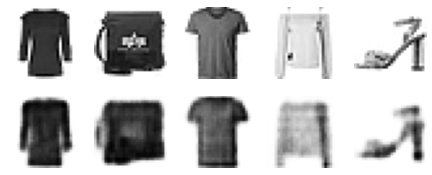

In [29]:
show_reconstruction(conv_ae)
plt.show()

# Recurrent AutoEncoders:

In [12]:
recurrent_encoder = keras.models.Sequential([
    keras.layers.LSTM(100, return_sequences=True, input_shape=[None, 28]),
    keras.layers.LSTM(30),
])
recurrent_decoder = keras.models.Sequential([
    keras.layers.RepeatVector(28, input_shape=[30]),
    keras.layers.LSTM(100, return_sequences=True),
    keras.layers.TimeDistributed(keras.layers.Dense(28, activation="sigmoid")),
])
recurrent_ae = keras.models.Sequential([recurrent_encoder, recurrent_decoder])

recurrent_ae.compile(loss="binary_crossentropy",
                     optimizer=keras.optimizers.SGD(lr=0.1),
                     metrics=[rounded_accuracy])

In [25]:
recurrent_ae.fit(X_train, X_train, epochs=15,
                 validation_data=(X_valid, X_valid))

Epoch 1/15
1719/1719 [==============================] - 48s 9ms/step - loss: 0.5623 - rounded_accuracy: 0.7053 - val_loss: 0.4441 - val_rounded_accuracy: 0.8258
Epoch 2/15
1719/1719 [==============================] - 15s 9ms/step - loss: 0.4175 - rounded_accuracy: 0.8344 - val_loss: 0.3748 - val_rounded_accuracy: 0.8621
Epoch 3/15
1719/1719 [==============================] - 15s 9ms/step - loss: 0.3695 - rounded_accuracy: 0.8667 - val_loss: 0.3606 - val_rounded_accuracy: 0.8730
Epoch 4/15
1719/1719 [==============================] - 15s 9ms/step - loss: 0.3559 - rounded_accuracy: 0.8774 - val_loss: 0.3527 - val_rounded_accuracy: 0.8795
Epoch 5/15
1719/1719 [==============================] - 15s 9ms/step - loss: 0.3446 - rounded_accuracy: 0.8861 - val_loss: 0.3399 - val_rounded_accuracy: 0.8891
Epoch 6/15
1719/1719 [==============================] - 15s 9ms/step - loss: 0.3372 - rounded_accuracy: 0.8906 - val_loss: 0.3312 - val_rounded_accuracy: 0.8961
Epoch 7/15
1719/1719 [============

# Denoising AutoEncoders:

In [13]:
dropout_encoder = keras.models.Sequential([
    keras.layers.Flatten(input_shape=[28,28]),
    keras.layers.Dropout(0.5),
    keras.layers.Dense(100, activation="selu"),
    keras.layers.Dense(30, activation="selu"),
])

dropout_decoder = keras.models.Sequential([
    keras.layers.Dense(100, activation="selu", input_shape=[30]),
    keras.layers.Dense(28*28, activation="sigmoid"),
    keras.layers.Reshape([28, 28])
])

dropout_ae = keras.models.Sequential([dropout_encoder, dropout_decoder])

In [14]:
dropout_ae.compile(loss="binary_crossentropy",
                   optimizer=keras.optimizers.SGD(lr=0.1),
                   metrics=[rounded_accuracy])
dropout_ae.fit(X_train, X_train, epochs=15,
               validation_data=(X_valid, X_valid))

Epoch 1/15
1719/1719 [==============================] - 5s 3ms/step - loss: 0.5549 - rounded_accuracy: 0.6950 - val_loss: 0.3973 - val_rounded_accuracy: 0.8363
Epoch 2/15
1719/1719 [==============================] - 4s 3ms/step - loss: 0.3836 - rounded_accuracy: 0.8470 - val_loss: 0.3636 - val_rounded_accuracy: 0.8672
Epoch 3/15
1719/1719 [==============================] - 4s 3ms/step - loss: 0.3617 - rounded_accuracy: 0.8678 - val_loss: 0.3496 - val_rounded_accuracy: 0.8818
Epoch 4/15
1719/1719 [==============================] - 5s 3ms/step - loss: 0.3484 - rounded_accuracy: 0.8799 - val_loss: 0.3366 - val_rounded_accuracy: 0.8923
Epoch 5/15
1719/1719 [==============================] - 5s 3ms/step - loss: 0.3368 - rounded_accuracy: 0.8892 - val_loss: 0.3282 - val_rounded_accuracy: 0.8990
Epoch 6/15
1719/1719 [==============================] - 4s 3ms/step - loss: 0.3313 - rounded_accuracy: 0.8941 - val_loss: 0.3236 - val_rounded_accuracy: 0.9020
Epoch 7/15
1719/1719 [==================

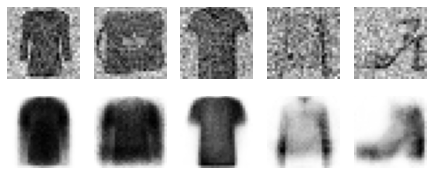

In [24]:
tf.random.set_seed(42)
np.random.seed(42)

noise = keras.layers.GaussianNoise(0.2)
show_reconstruction(dropout_ae, noise(X_valid, training=True))
plt.show()

# Sparse Autoencoders:

In [14]:
sparse_l1_encoder = keras.models.Sequential([
    keras.layers.Flatten(input_shape=[28, 28]),
    keras.layers.Dense(100, activation="selu"),
    keras.layers.Dense(300, activation="sigmoid"),
    keras.layers.ActivityRegularization(l1=1e-3),
])
sparse_l1_decoder = keras.models.Sequential([
    keras.layers.Dense(100, activation="selu", input_shape=[300]),
    keras.layers.Dense(28*28, activation="sigmoid"),
    keras.layers.Reshape([28, 28])
])
sparse_l1_ae = keras.models.Sequential([sparse_l1_encoder, sparse_l1_decoder])

In [28]:
sparse_l1_ae.compile(loss="binary_crossentropy",
                     optimizer=keras.optimizers.SGD(lr=0.1),
                     metrics=[rounded_accuracy])
sparse_l1_ae.fit(X_train, X_train, epochs=15,
                 validation_data=(X_valid, X_valid))

Epoch 1/15
1719/1719 [==============================] - 5s 3ms/step - loss: 0.6666 - rounded_accuracy: 0.6826 - val_loss: 0.5089 - val_rounded_accuracy: 0.7299
Epoch 2/15
1719/1719 [==============================] - 5s 3ms/step - loss: 0.4987 - rounded_accuracy: 0.7374 - val_loss: 0.4791 - val_rounded_accuracy: 0.7627
Epoch 3/15
1719/1719 [==============================] - 5s 3ms/step - loss: 0.4685 - rounded_accuracy: 0.7757 - val_loss: 0.4424 - val_rounded_accuracy: 0.7978
Epoch 4/15
1719/1719 [==============================] - 5s 3ms/step - loss: 0.4337 - rounded_accuracy: 0.8029 - val_loss: 0.4187 - val_rounded_accuracy: 0.8175
Epoch 5/15
1719/1719 [==============================] - 5s 3ms/step - loss: 0.4123 - rounded_accuracy: 0.8241 - val_loss: 0.4052 - val_rounded_accuracy: 0.8333
Epoch 6/15
1719/1719 [==============================] - 5s 3ms/step - loss: 0.4010 - rounded_accuracy: 0.8374 - val_loss: 0.3963 - val_rounded_accuracy: 0.8423
Epoch 7/15
1719/1719 [==================

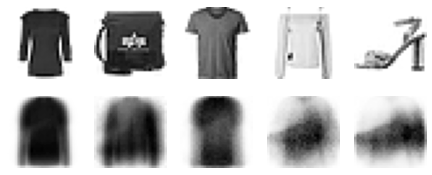

In [31]:
show_reconstruction(sparse_l1_ae)

In [15]:
K = keras.backend
kl_divergence = keras.losses.kullback_leibler_divergence

In [16]:
class KLDivergenceRegularizer(keras.regularizers.Regularizer):
    def __init__(self, weight, target=0.1):
        self.weight = weight
        self.target = target

    def __call__(self, inputs):
        mean_activities = K.mean(inputs, axis=0)
        return self.weight * (
            kl_divergence(self.target, mean_activities) + 
            kl_divergence(1. - self.target, 1. - mean_activities))

In [17]:
kld_reg = KLDivergenceRegularizer(weight=0.05, target=0.1)
sparse_kl_encoder = keras.models.Sequential([
    keras.layers.Flatten(input_shape=[28, 28]),
    keras.layers.Dense(100, activation="selu"),
    keras.layers.Dense(300, activation="sigmoid", activity_regularizer=kld_reg)
])
sparse_kl_decoder = keras.models.Sequential([
    keras.layers.Dense(100, activation="selu", input_shape=[300]),
    keras.layers.Dense(28*28, activation="sigmoid"),
    keras.layers.Reshape([28, 28])
])
sparse_kl_ae = keras.models.Sequential([sparse_kl_encoder, sparse_kl_decoder])

In [24]:
sparse_kl_ae.compile(loss="binary_crossentropy",
                     optimizer=keras.optimizers.SGD(lr=0.1),
                     metrics=[rounded_accuracy])
sparse_kl_ae.fit(X_train, X_train, epochs=15,
                 validation_data=(X_valid, X_valid))

Epoch 1/15
1719/1719 [==============================] - 7s 3ms/step - loss: 0.6343 - rounded_accuracy: 0.6789 - val_loss: 0.4846 - val_rounded_accuracy: 0.7233
Epoch 2/15
1719/1719 [==============================] - 6s 3ms/step - loss: 0.4778 - rounded_accuracy: 0.7297 - val_loss: 0.4675 - val_rounded_accuracy: 0.7450
Epoch 3/15
1719/1719 [==============================] - 6s 3ms/step - loss: 0.4594 - rounded_accuracy: 0.7587 - val_loss: 0.4343 - val_rounded_accuracy: 0.7969
Epoch 4/15
1719/1719 [==============================] - 6s 3ms/step - loss: 0.4225 - rounded_accuracy: 0.8059 - val_loss: 0.4032 - val_rounded_accuracy: 0.8248
Epoch 5/15
1719/1719 [==============================] - 6s 3ms/step - loss: 0.3965 - rounded_accuracy: 0.8309 - val_loss: 0.3907 - val_rounded_accuracy: 0.8378
Epoch 6/15
1719/1719 [==============================] - 5s 3ms/step - loss: 0.3868 - rounded_accuracy: 0.8413 - val_loss: 0.3840 - val_rounded_accuracy: 0.8447
Epoch 7/15
1719/1719 [==================

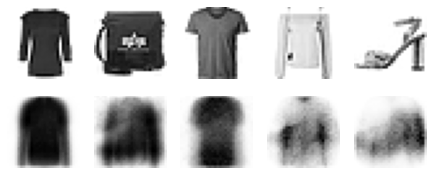

In [25]:
show_reconstruction(sparse_kl_ae)

# Variational AutoEncoders:

In [23]:
K = keras.backend

In [18]:
class Sampling(keras.layers.Layer):
    def call(self, inputs):
        mean, log_var = inputs
        return keras.backend.random_normal(tf.shape(log_var)) * keras.backend.exp(log_var / 2) + mean

In [20]:
codings_size = 10

inputs = keras.layers.Input(shape=[28, 28])
z = keras.layers.Flatten()(inputs)
z = keras.layers.Dense(150, activation="selu")(z)
z = keras.layers.Dense(100, activation="selu")(z)
codings_mean = keras.layers.Dense(codings_size)(z)
codings_log_var = keras.layers.Dense(codings_size)(z)
codings = Sampling()([codings_mean, codings_log_var])
variational_encoder = keras.Model(inputs=[inputs],
                                  outputs=[codings_mean,
                                           codings_log_var,
                                           codings]
                                  )

In [21]:
decoder_inputs = keras.layers.Input(shape=[codings_size])
x = keras.layers.Dense(100, activation="selu")(decoder_inputs)
x = keras.layers.Dense(150, activation="selu")(x)
x = keras.layers.Dense(28 * 28, activation="sigmoid")(x)
outputs = keras.layers.Reshape([28, 28])(x)
variational_decoder = keras.Model(inputs=[decoder_inputs], outputs=[outputs])

In [22]:
_, _, codings = variational_encoder(inputs)
reconstructions = variational_decoder(codings)
variational_ae = keras.Model(inputs=[inputs], outputs=[reconstructions])

In [24]:
latent_loss = -0.5 * K.sum(
    1 + codings_log_var - K.exp(codings_log_var) - K.square(codings_mean),
    axis=-1)
variational_ae.add_loss(K.mean(latent_loss) / 784.)
variational_ae.compile(loss="binary_crossentropy", optimizer="rmsprop")

In [25]:
history = variational_ae.fit(X_train, X_train, epochs=50, batch_size=128,
                             validation_data=(X_valid, X_valid))

Epoch 1/50
430/430 [==============================] - 3s 5ms/step - loss: 0.4415 - val_loss: 0.3601
Epoch 2/50
430/430 [==============================] - 2s 5ms/step - loss: 0.3475 - val_loss: 0.3361
Epoch 3/50
430/430 [==============================] - 2s 5ms/step - loss: 0.3346 - val_loss: 0.3306
Epoch 4/50
430/430 [==============================] - 2s 5ms/step - loss: 0.3288 - val_loss: 0.3292
Epoch 5/50
430/430 [==============================] - 2s 5ms/step - loss: 0.3251 - val_loss: 0.3303
Epoch 6/50
430/430 [==============================] - 2s 5ms/step - loss: 0.3240 - val_loss: 0.3255
Epoch 7/50
430/430 [==============================] - 2s 5ms/step - loss: 0.3217 - val_loss: 0.3219
Epoch 8/50
430/430 [==============================] - 2s 5ms/step - loss: 0.3193 - val_loss: 0.3218
Epoch 9/50
430/430 [==============================] - 2s 5ms/step - loss: 0.3193 - val_loss: 0.3211
Epoch 10/50
430/430 [==============================] - 2s 5ms/step - loss: 0.3175 - val_loss: 0.3201

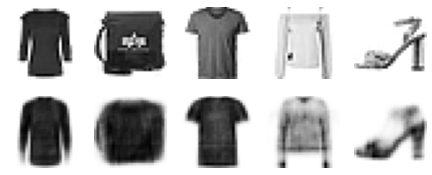

In [28]:
show_reconstruction(variational_ae)
plt.show()

## Generating Random Fashion images:

In [29]:
def plot_multiple_images(images, n_cols=None):
    n_cols = n_cols or len(images)
    n_rows = (len(images) - 1) // n_cols + 1
    if images.shape[-1] == 1:
        images = np.squeeze(images, axis=-1)
    plt.figure(figsize=(n_cols, n_rows))
    for index, image in enumerate(images):
        plt.subplot(n_rows, n_cols, index + 1)
        plt.imshow(image, cmap="binary")
        plt.axis("off")

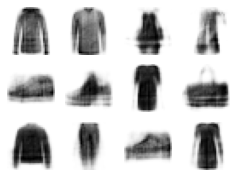

In [31]:
codings = tf.random.normal(shape=[12, codings_size])
images = variational_decoder(codings).numpy()
plot_multiple_images(images, 4)

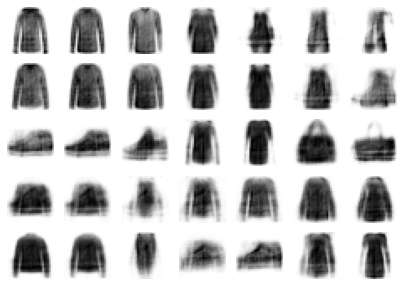

In [34]:
codings_grid = tf.reshape(codings, [1, 3, 4, codings_size])
larger_grid = tf.image.resize(codings_grid, size=[5, 7])
interpolated_codings = tf.reshape(larger_grid, [-1, codings_size])
images = variational_decoder(interpolated_codings).numpy()
plot_multiple_images(images, 7)

# GANs:

In [56]:
codings_size = 10

generator = keras.models.Sequential([
    keras.layers.Dense(100, activation="selu", input_shape=[codings_size]),
    keras.layers.Dense(150, activation="selu"),
    keras.layers.Dense(28 * 28, activation="sigmoid"),
    keras.layers.Reshape([28, 28])
])

In [57]:
discriminator = keras.models.Sequential([
    keras.layers.Flatten(input_shape=[28, 28]),
    keras.layers.Dense(150, activation="selu"),
    keras.layers.Dense(100, activation="selu"),
    keras.layers.Dense(1, activation="sigmoid"),
])

gan = keras.models.Sequential([generator, discriminator])

In [58]:
discriminator.compile(loss="binary_crossentropy", optimizer="rmsprop")
discriminator.trainable = False
gan.compile(loss="binary_crossentropy", optimizer="rmsprop")

In [59]:
batch_size = 32
dataset = tf.data.Dataset.from_tensor_slices(X_train).shuffle(1000)
dataset = dataset.batch(batch_size, drop_remainder=True).prefetch(1)

In [60]:
def train_gan(gan, dataset, batch_size, codings_size, n_epochs=50):
    generator, discriminator = gan.layers
    for epoch in range(n_epochs):
        print("Epoch {}/{}".format(epoch + 1, n_epochs))
        for X_batch in dataset:
            # phase 1 - training the discriminator
            noise = tf.random.normal(shape=[batch_size, codings_size])
            generated_images = generator(noise)
            X_fake_and_real = tf.concat([generated_images, X_batch], axis=0)
            y1 = tf.constant([[0.]] * batch_size + [[1.]] * batch_size)
            discriminator.trainable = True
            discriminator.train_on_batch(X_fake_and_real, y1)
            
            #phase 2 - training the generator
            noise = tf.random.normal(shape=[batch_size, codings_size])
            y2 = tf.constant([[1.]] * batch_size)
            discriminator.trainable = False
            gan.train_on_batch(noise, y2)
        plot_multiple_images(generated_images, 8)                     # not shown
        plt.show()

Epoch 1/1


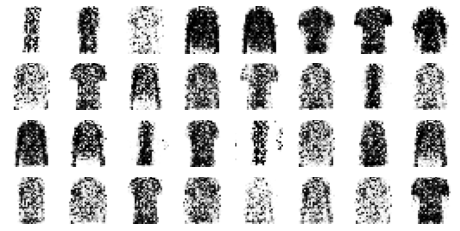

In [61]:
train_gan(gan, dataset, batch_size, codings_size, n_epochs=1)

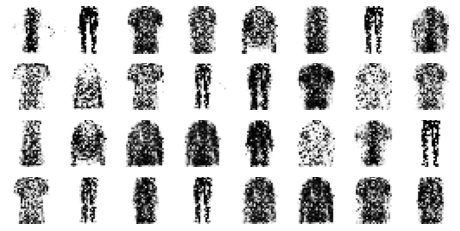

In [62]:
tf.random.set_seed(42)
np.random.seed(42)

noise = tf.random.normal(shape=[batch_size, codings_size])
generated_images = generator(noise)
plot_multiple_images(generated_images, 8)

Epoch 1/50


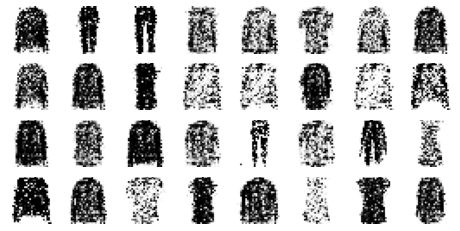

Epoch 2/50


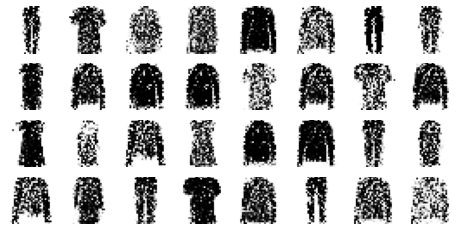

Epoch 3/50


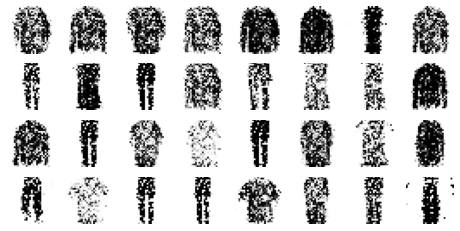

Epoch 4/50


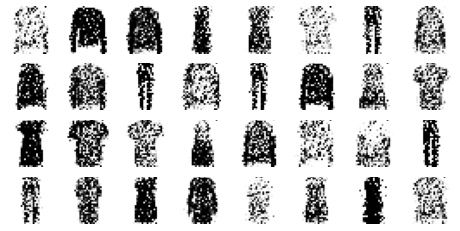

Epoch 5/50


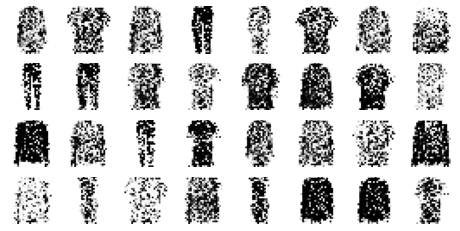

Epoch 6/50


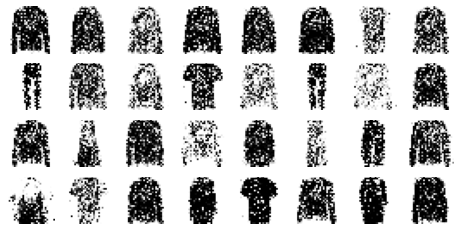

Epoch 7/50


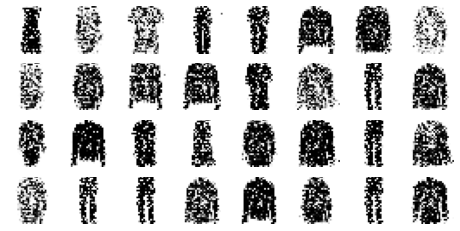

Epoch 8/50


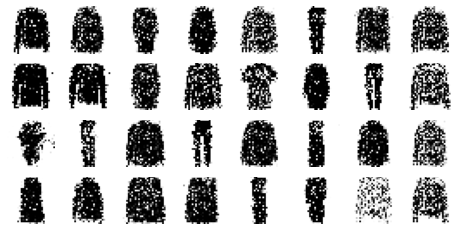

Epoch 9/50


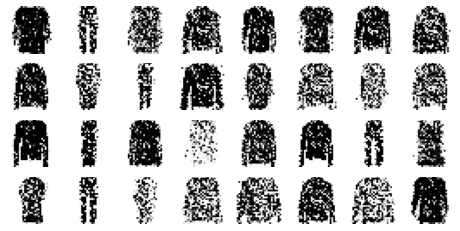

Epoch 10/50


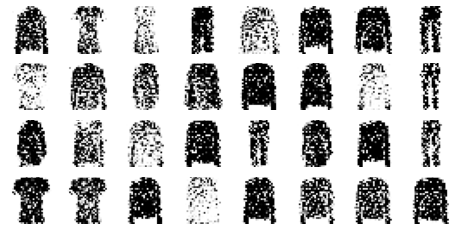

Epoch 11/50


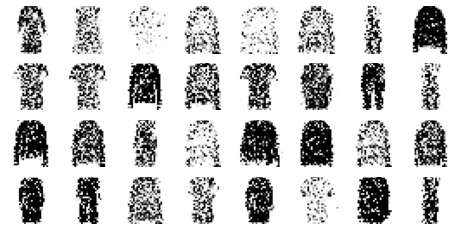

Epoch 12/50


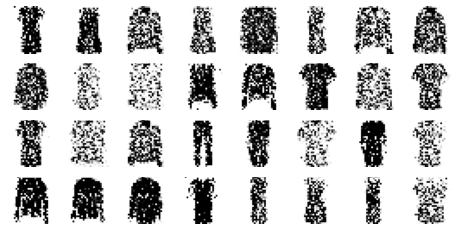

Epoch 13/50


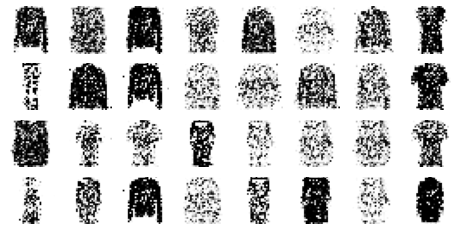

Epoch 14/50


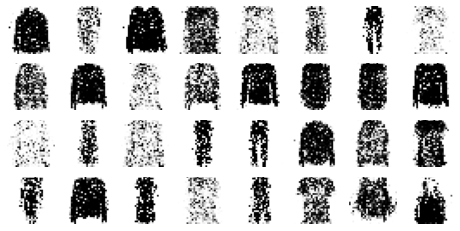

Epoch 15/50


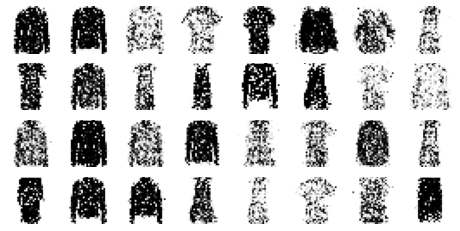

Epoch 16/50


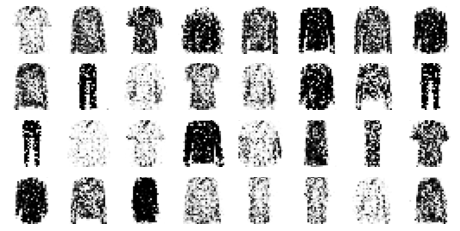

Epoch 17/50


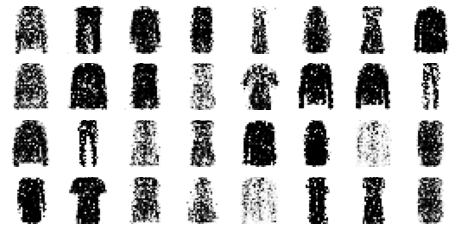

Epoch 18/50


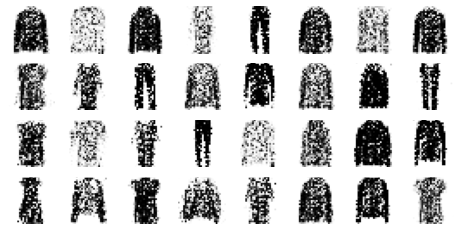

Epoch 19/50


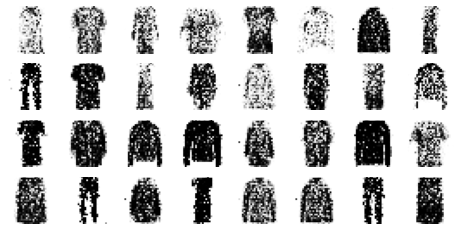

Epoch 20/50


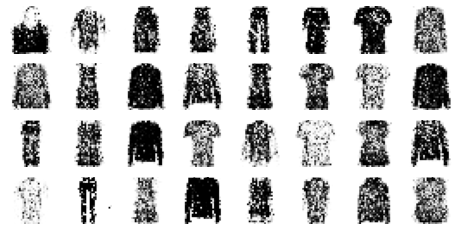

Epoch 21/50


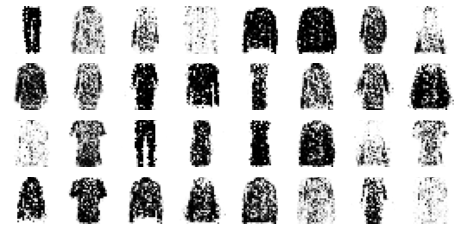

Epoch 22/50


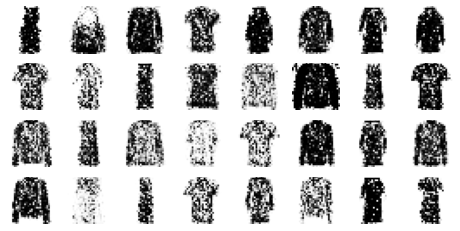

Epoch 23/50


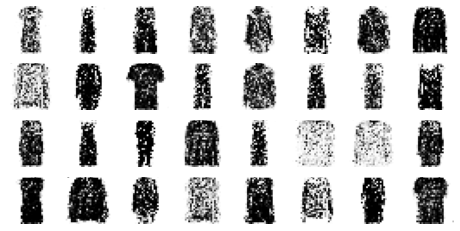

Epoch 24/50


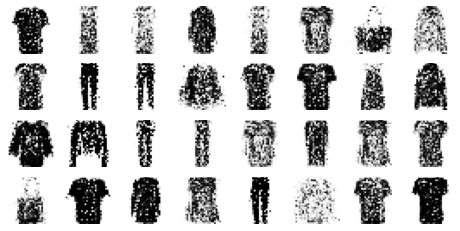

Epoch 25/50


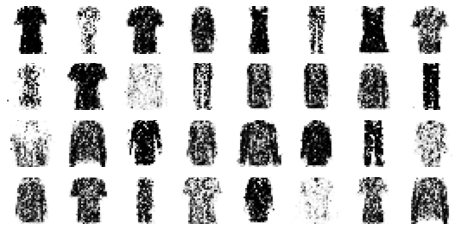

Epoch 26/50


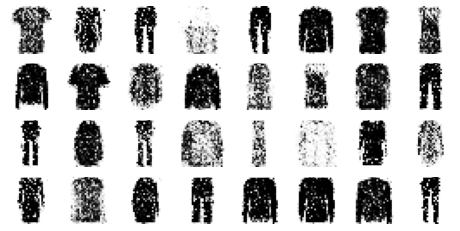

Epoch 27/50


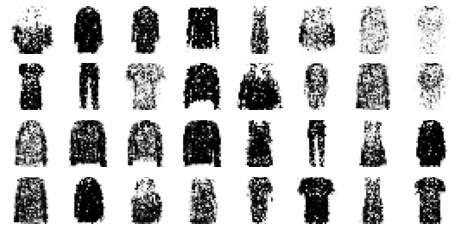

Epoch 28/50


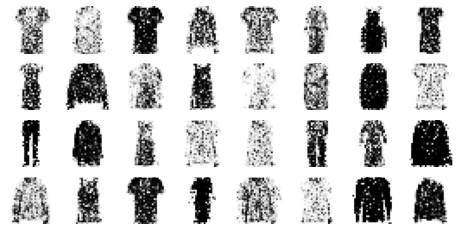

Epoch 29/50


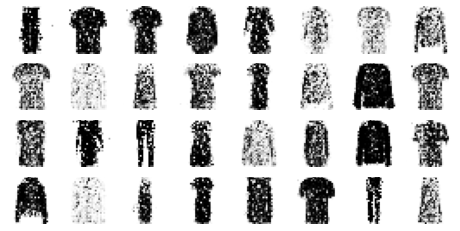

Epoch 30/50


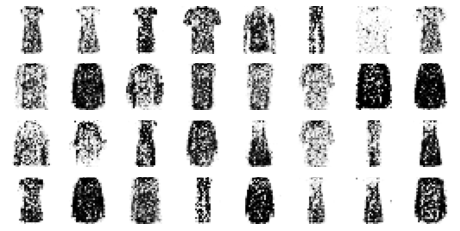

Epoch 31/50


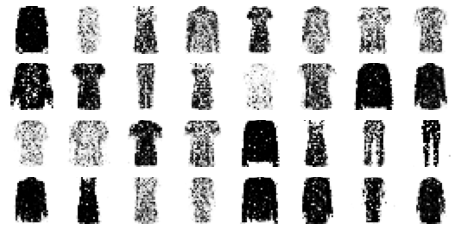

Epoch 32/50


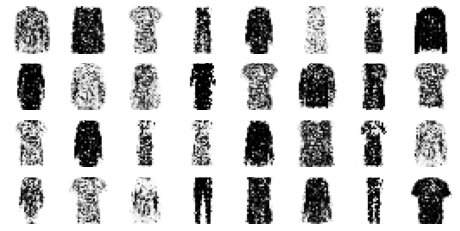

Epoch 33/50


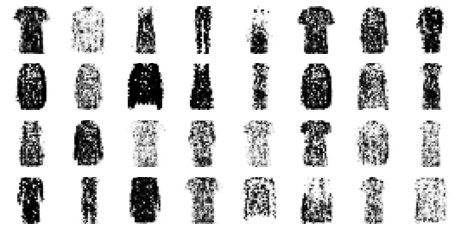

Epoch 34/50


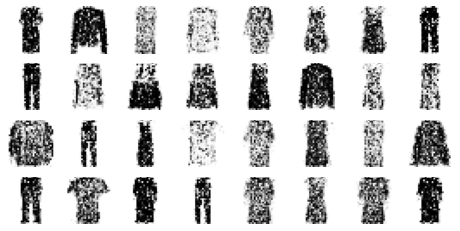

Epoch 35/50


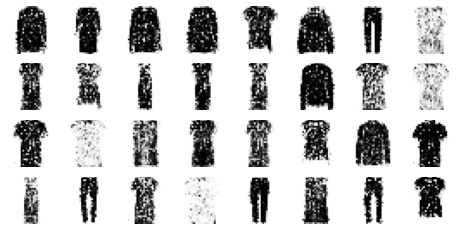

Epoch 36/50


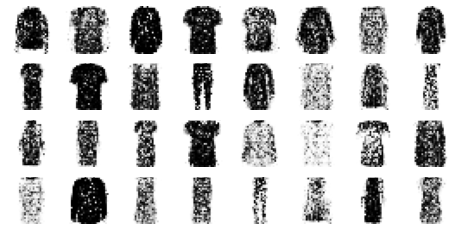

Epoch 37/50


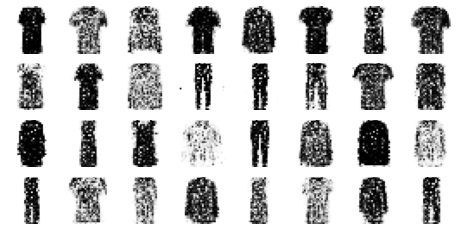

Epoch 38/50


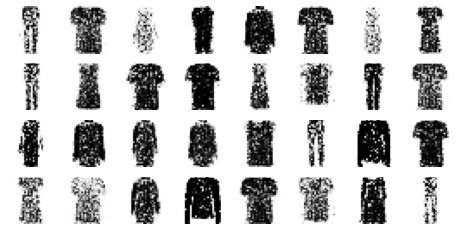

Epoch 39/50


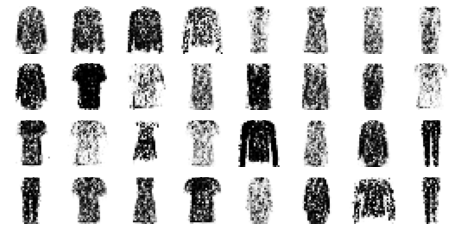

Epoch 40/50


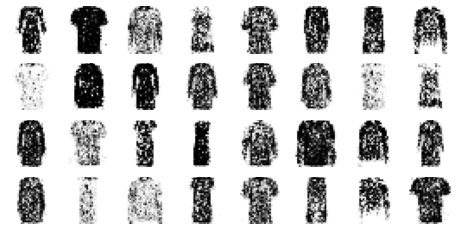

Epoch 41/50


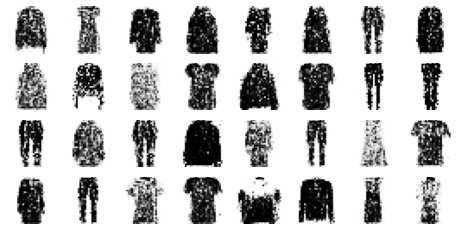

Epoch 42/50


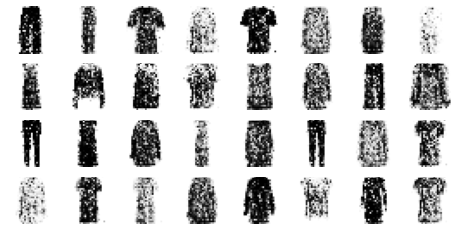

Epoch 43/50


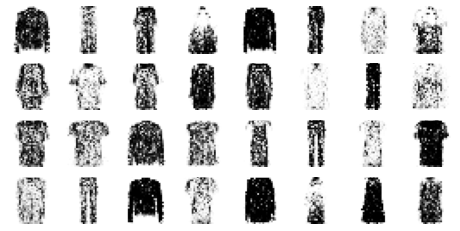

Epoch 44/50


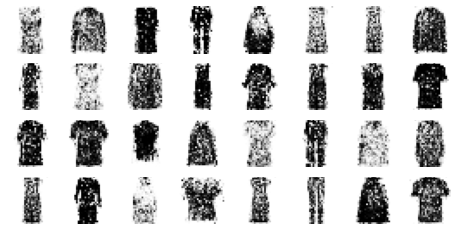

Epoch 45/50


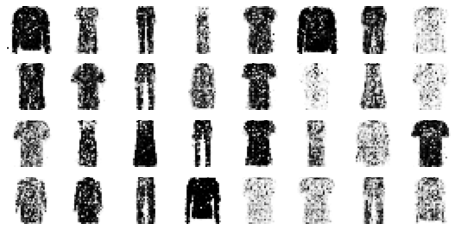

Epoch 46/50


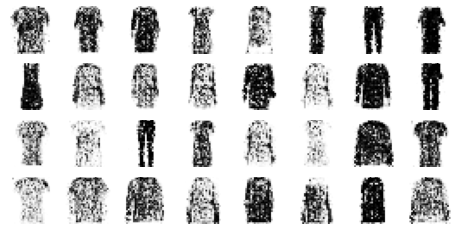

Epoch 47/50


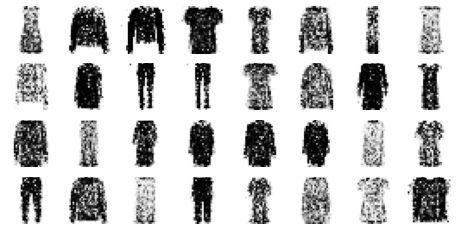

Epoch 48/50


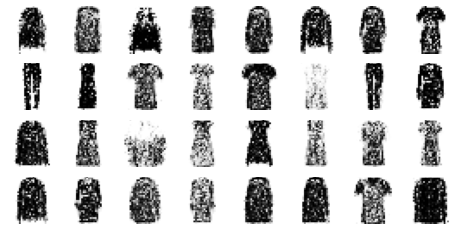

Epoch 49/50


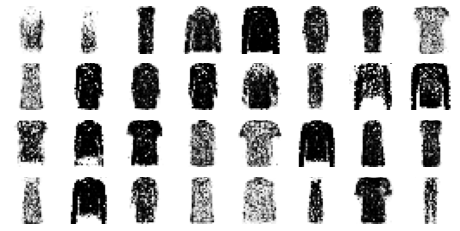

Epoch 50/50


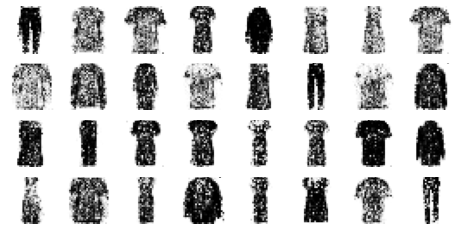

In [63]:
train_gan(gan, dataset, batch_size, codings_size)

# Deep Convolutional GANs:

In [64]:
tf.random.set_seed(42)
np.random.seed(42)

codings_size = 100

generator = keras.models.Sequential([
    keras.layers.Dense(7 * 7 * 128, input_shape=[codings_size]),
    keras.layers.Reshape([7, 7, 128]),
    keras.layers.BatchNormalization(),
    keras.layers.Conv2DTranspose(64, kernel_size=5, strides=2, padding="SAME",
                                 activation="selu"),
    keras.layers.BatchNormalization(),
    keras.layers.Conv2DTranspose(1, kernel_size=5, strides=2, padding="SAME",
                                 activation="tanh"),
])

discriminator = keras.models.Sequential([
    keras.layers.Conv2D(64, kernel_size=5, strides=2, padding="SAME",
                        activation=keras.layers.LeakyReLU(0.2),
                        input_shape=[28, 28, 1]),
    keras.layers.Dropout(0.4),
    keras.layers.Conv2D(128, kernel_size=5, strides=2, padding="SAME",
                        activation=keras.layers.LeakyReLU(0.2)),
    keras.layers.Dropout(0.4),
    keras.layers.Flatten(),
    keras.layers.Dense(1, activation="sigmoid"),
])

gan = keras.models.Sequential([generator, discriminator])

In [67]:
generator.summary()
discriminator.summary()
gan.summary()

Model: "sequential_30"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_48 (Dense)             (None, 6272)              633472    
_________________________________________________________________
reshape_10 (Reshape)         (None, 7, 7, 128)         0         
_________________________________________________________________
batch_normalization (BatchNo (None, 7, 7, 128)         512       
_________________________________________________________________
conv2d_transpose_3 (Conv2DTr (None, 14, 14, 64)        204864    
_________________________________________________________________
batch_normalization_1 (Batch (None, 14, 14, 64)        256       
_________________________________________________________________
conv2d_transpose_4 (Conv2DTr (None, 28, 28, 1)         1601      
Total params: 840,705
Trainable params: 840,321
Non-trainable params: 384
_____________________________________________

In [65]:
discriminator.compile(loss="binary_crossentropy", optimizer="rmsprop")
discriminator.trainable = False
gan.compile(loss="binary_crossentropy", optimizer="rmsprop")

In [69]:
X_train_dcgan = X_train.reshape(-1, 28, 28, 1) * 2. - 1.
X_train_dcgan.shape

(55000, 28, 28, 1)

In [70]:
batch_size = 32
dataset = tf.data.Dataset.from_tensor_slices(X_train_dcgan)
dataset = dataset.shuffle(1000)
dataset = dataset.batch(batch_size, drop_remainder=True).prefetch(1)

Epoch 1/50


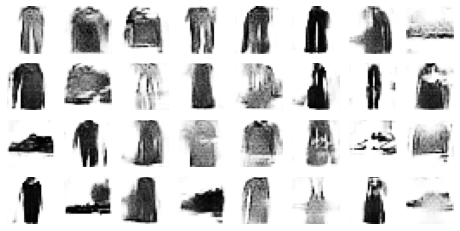

Epoch 2/50


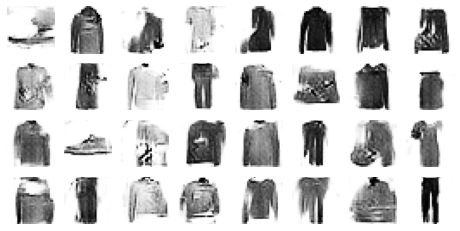

Epoch 3/50


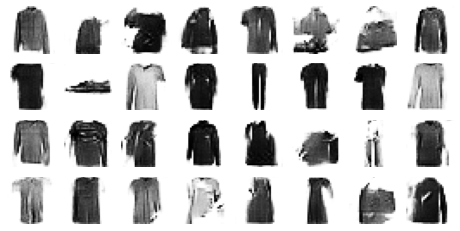

Epoch 4/50


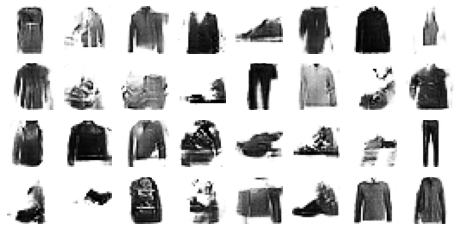

Epoch 5/50


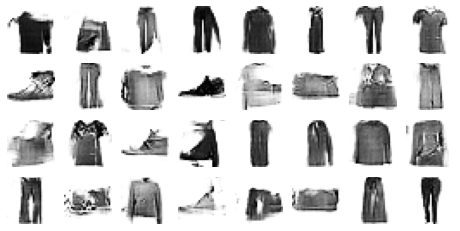

Epoch 6/50


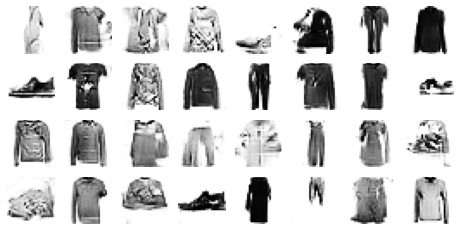

Epoch 7/50


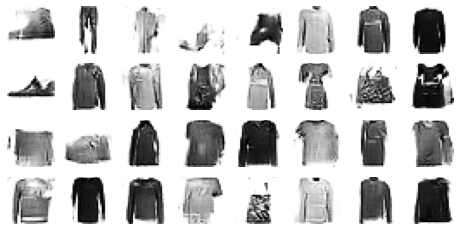

Epoch 8/50


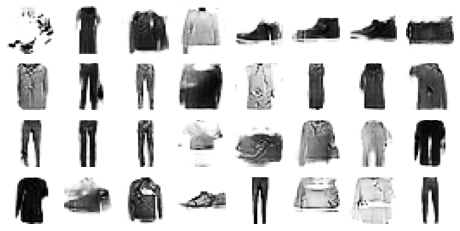

Epoch 9/50


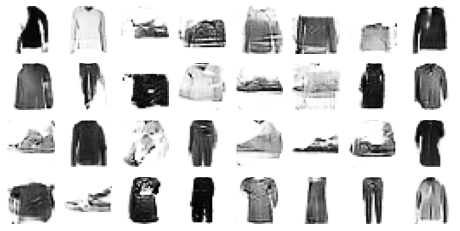

Epoch 10/50


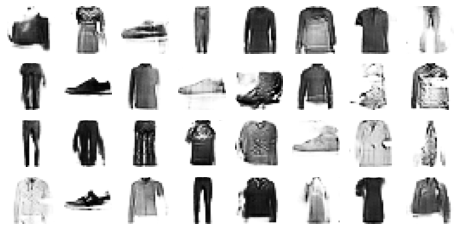

Epoch 11/50


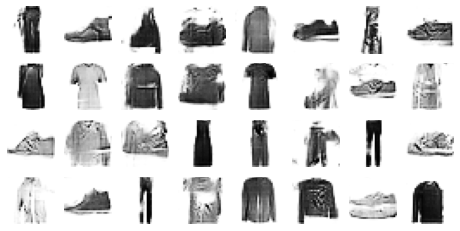

Epoch 12/50


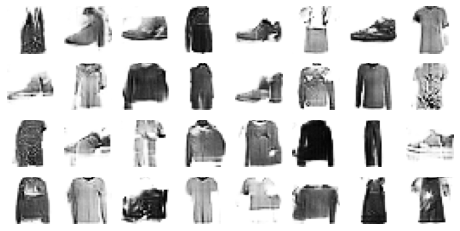

Epoch 13/50


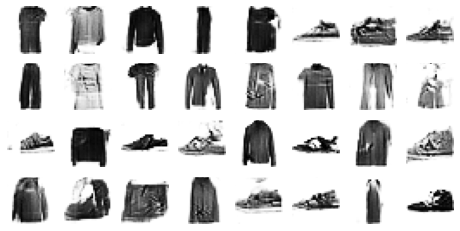

Epoch 14/50


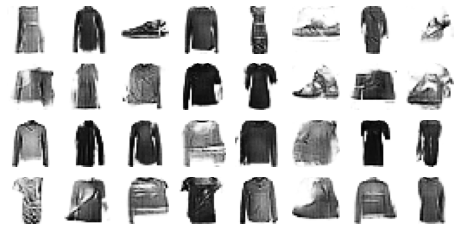

Epoch 15/50


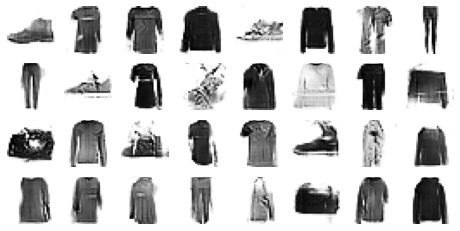

Epoch 16/50


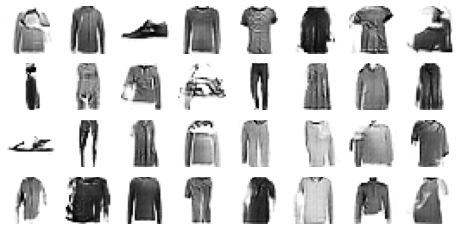

Epoch 17/50


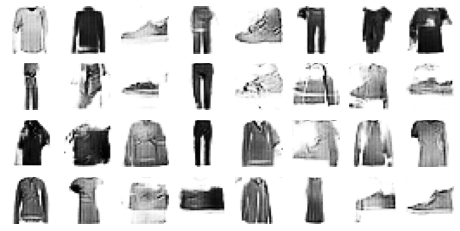

Epoch 18/50


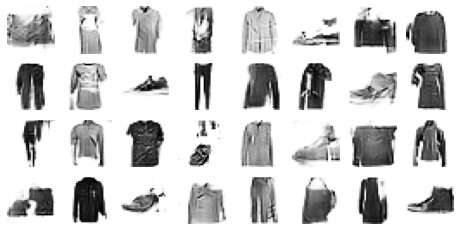

Epoch 19/50


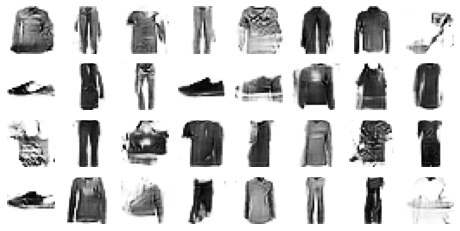

Epoch 20/50


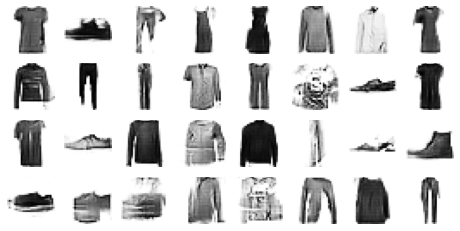

Epoch 21/50


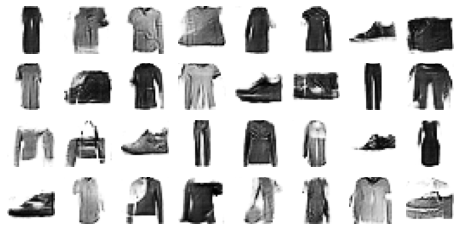

Epoch 22/50


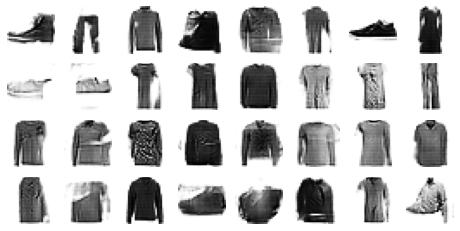

Epoch 23/50


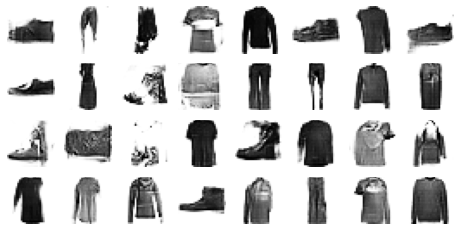

Epoch 24/50


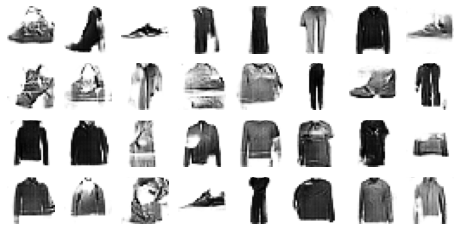

Epoch 25/50


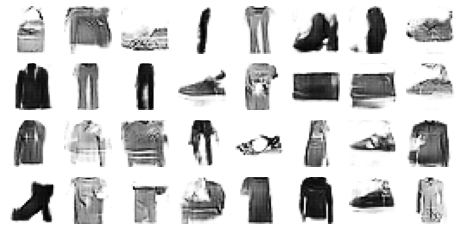

Epoch 26/50


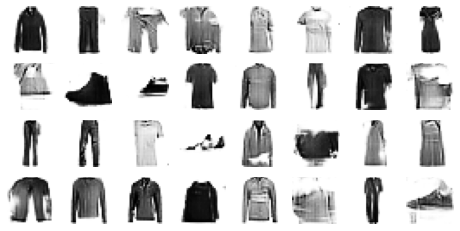

Epoch 27/50


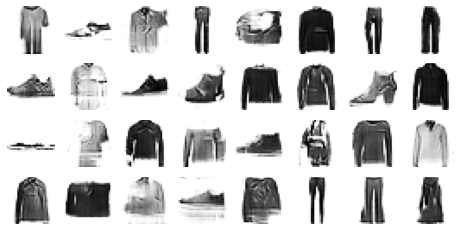

Epoch 28/50


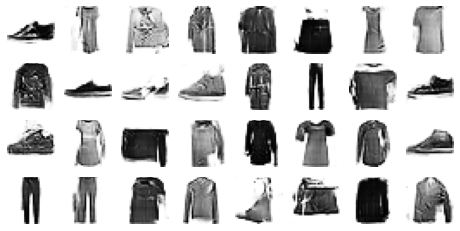

Epoch 29/50


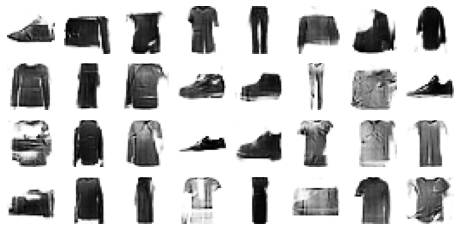

Epoch 30/50


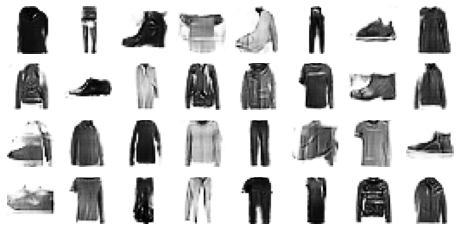

Epoch 31/50


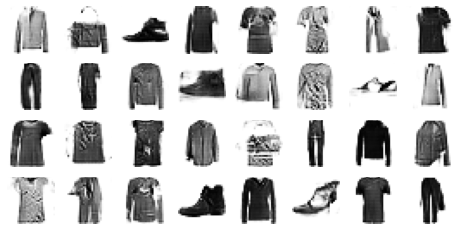

Epoch 32/50


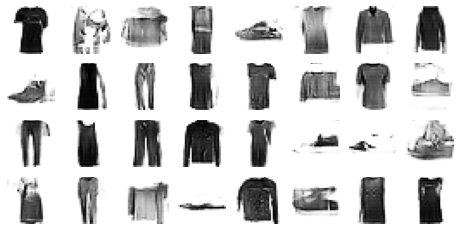

Epoch 33/50


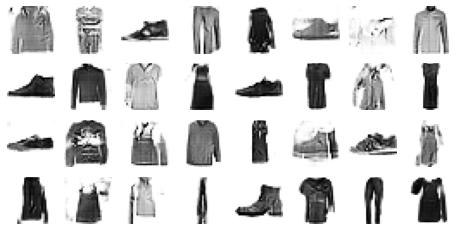

Epoch 34/50


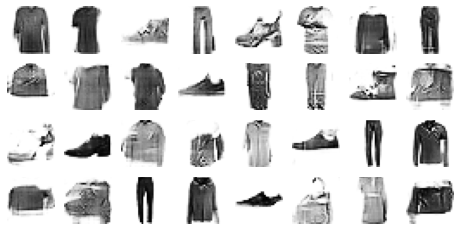

Epoch 35/50


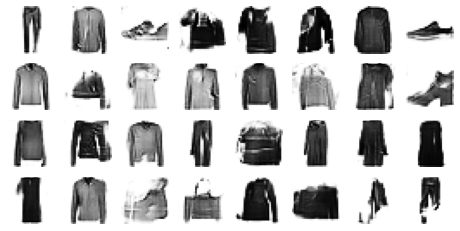

Epoch 36/50


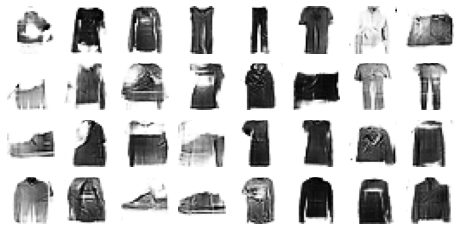

Epoch 37/50


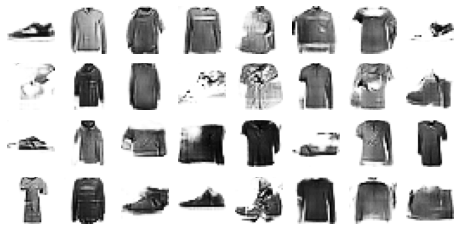

Epoch 38/50


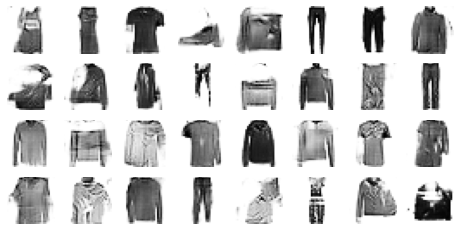

Epoch 39/50


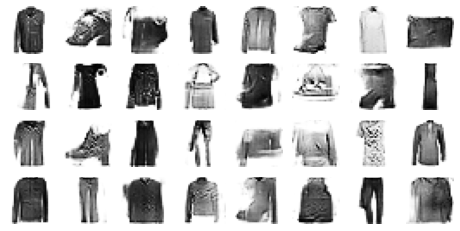

Epoch 40/50


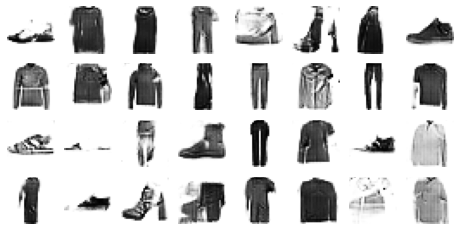

Epoch 41/50


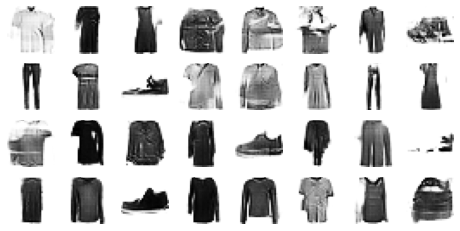

Epoch 42/50


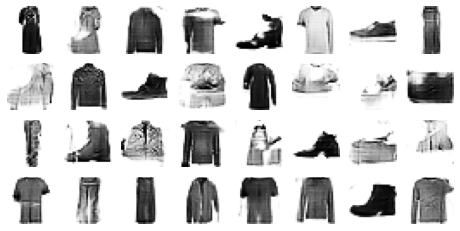

Epoch 43/50


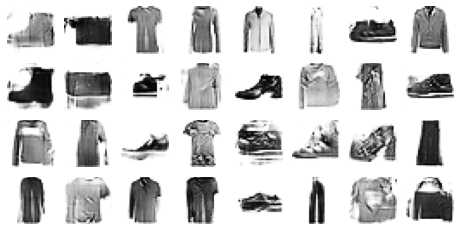

Epoch 44/50


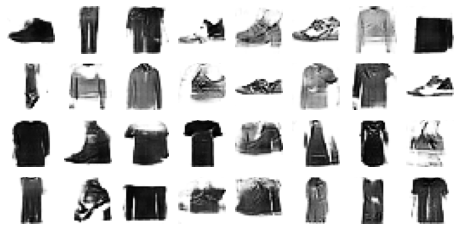

Epoch 45/50


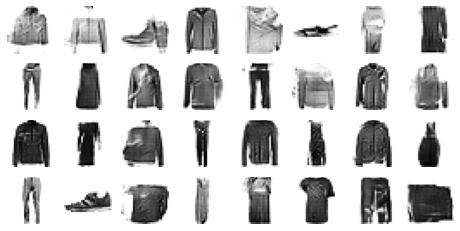

Epoch 46/50


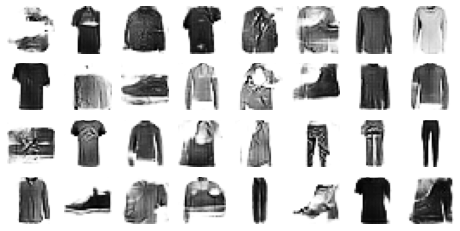

Epoch 47/50


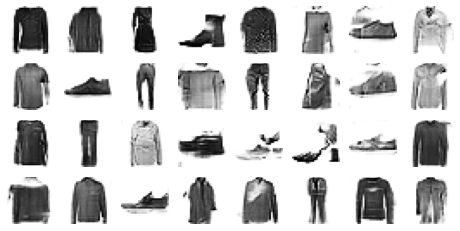

Epoch 48/50


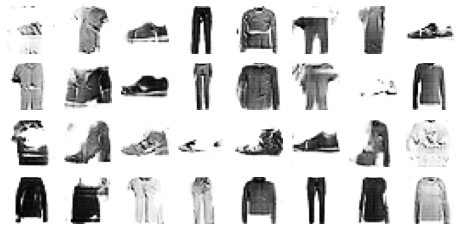

Epoch 49/50


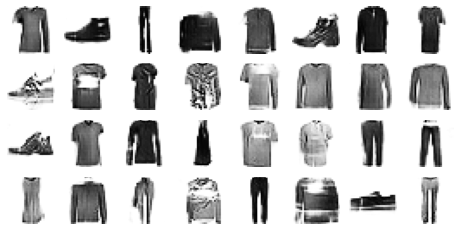

Epoch 50/50


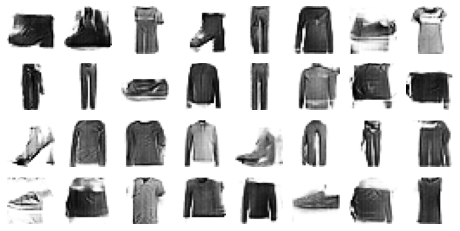

In [71]:
train_gan(gan, dataset, batch_size, codings_size)